# PROJECT HAND SIGN 
Jorge Martínez López - A01704518 



### DOWNLOAD DATASET

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
'''
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

'''

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

'\nimport numpy as np # linear algebra\nimport pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)\n\n# Input data files are available in the read-only "../input/" directory\n# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory\n\nimport os\nfor dirname, _, filenames in os.walk(\'/kaggle/input\'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\n\n'

### LIBRARY

In [1]:
# GLOBAL
import numpy as np 
import tensorflow as tf

# GRAPH
import matplotlib.pyplot as plt
import seaborn as sns 
from tensorflow.keras.utils import plot_model

# IMAGE
from PIL import Image
from  tensorflow.keras.preprocessing.image import ImageDataGenerator 

# SYSTEM
import os

# MODEL CNN
from tensorflow.keras.applications import MobileNetV2,ResNet101V2

# CNN
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import GlobalAveragePooling2D , Dropout , Dense, Conv2D, MaxPooling2D, Flatten, Input,BatchNormalization

# OPTIMIZER
from tensorflow.keras.optimizers import Adam 
from tensorflow.keras.regularizers import l2

# PRECISION 
from tensorflow.keras.metrics import Recall ,Precision

# CALLBACK 
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

print('R')

R


<hr>

## LOAD DATASET

### TRAIN / TEST

In [3]:

train_path= '/kaggle/input/american-sign-language/ASL_Dataset/Train'
test_path= '/kaggle/input/american-sign-language/ASL_Dataset/Test'

### LABEL

In [4]:
labels=os.listdir(train_path)

print(labels,len(labels))

['N', 'R', 'Space', 'B', 'I', 'F', 'H', 'E', 'U', 'M', 'X', 'K', 'Q', 'Y', 'S', 'G', 'A', 'O', 'T', 'V', 'Z', 'C', 'P', 'L', 'W', 'D', 'Nothing', 'J'] 28


### SHOW THE FIRST IMAGE EACH LABEL

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62069B3FD0> N1337.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A6206A651B0> 1269.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A6206884400> Space201.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62068B53F0> B634.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62068E6440> I1546.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A6206718F40> F666.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62067840D0> H66.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62067B1090> E2576.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A62067DE110> U1783.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A6206614370> M1983.jpg
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=400x400 at 0x7A620667C040> 

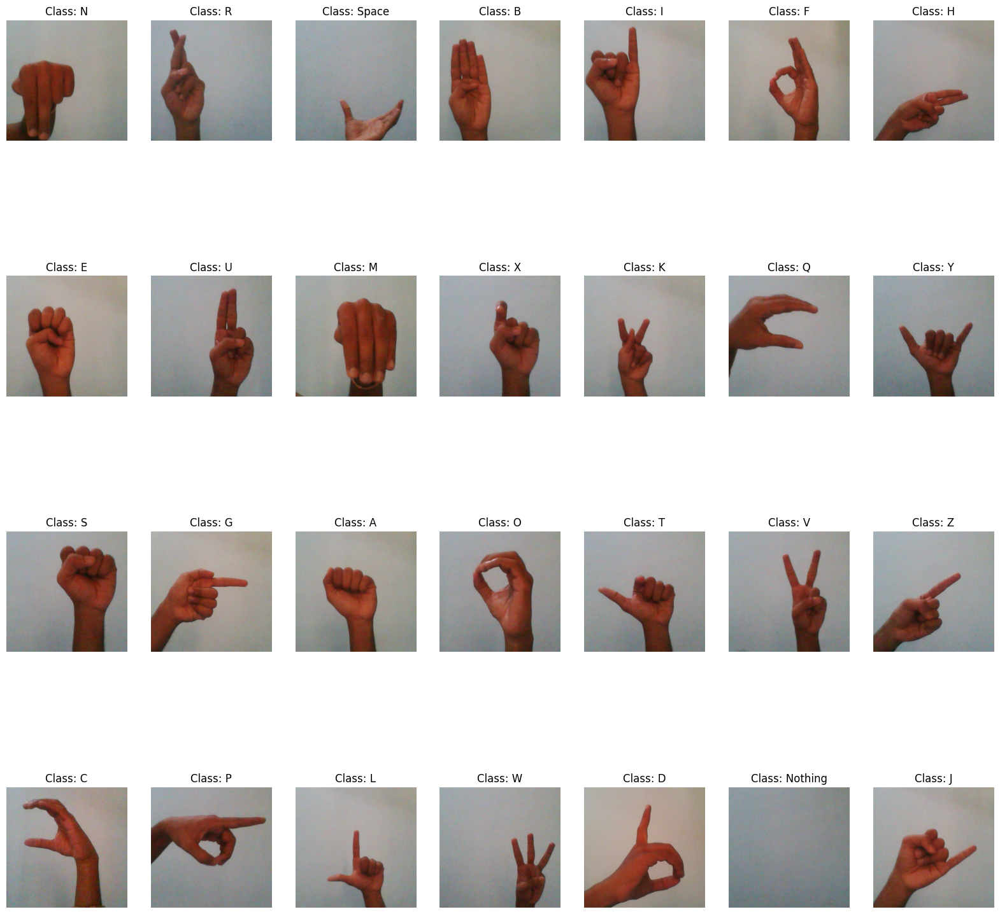

In [4]:
n=1

plt.figure(figsize=(20,20))     

for i in labels:

    class_folder = os.path.join(train_path, i) 

    image_name = os.listdir(class_folder)[0]  

    image_path = os.path.join(class_folder, image_name)

    image = Image.open(image_path)
    print(image,image_name)
    # 4 renglones de 7 columnas para 28 clases 
    plt.subplot(4,7,n)
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Class: {i}")
    n+=1

plt.show()

<hr>

## ANALYSIS DATASET

### SHOW DISTRIBUTION LABELS 

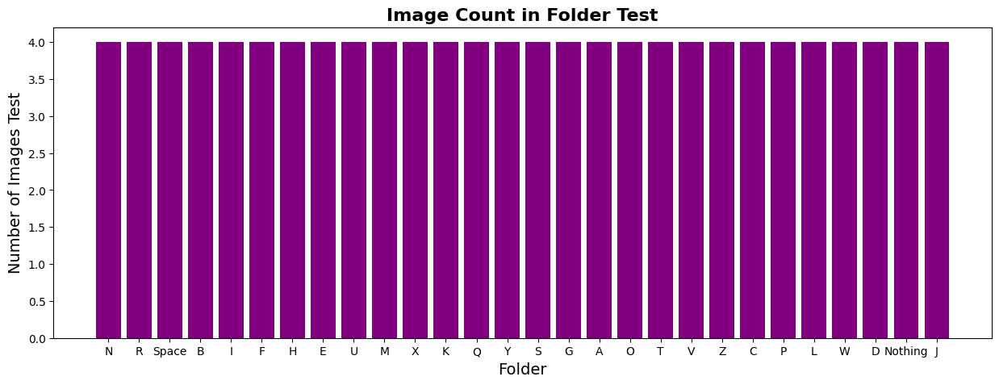

In [6]:
IMAGES=[]   

for i in labels:

    class_folder = os.path.join(test_path, i) 
    
    image_name = os.listdir(class_folder)
    nn=0
    for ii in range(len(image_name)):
        nn+=1
    #print(f'Folder: {i} {nn}')
    IMAGES.append(nn)

plt.figure(figsize=(15, 5)) 
plt.bar(labels, IMAGES,color="purple")
plt.ylabel('Number of Images Test', fontsize=14)
plt.xlabel('Folder', fontsize=14)
plt.title('Image Count in Folder Test', fontsize=16, fontweight='bold')
plt.show()


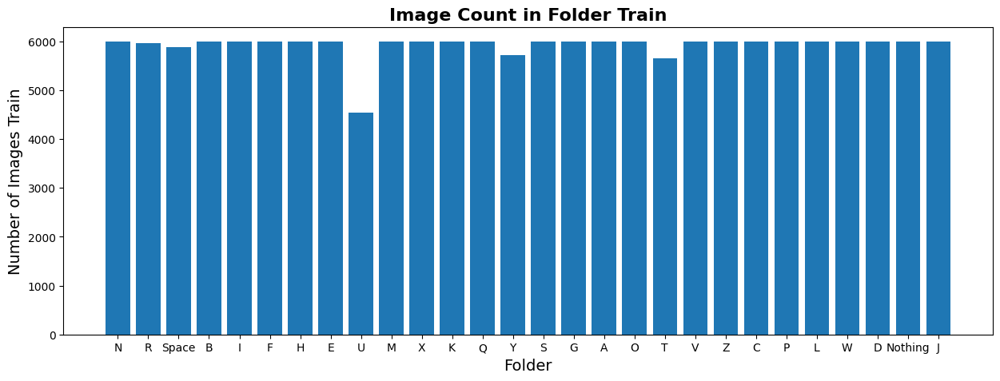

In [7]:

IMAGES=[]   

for i in labels:

    class_folder = os.path.join(train_path, i) 
    
    image_name = os.listdir(class_folder)
    nn=0
    for ii in range(len(image_name)):
        nn+=1
    #print(f'Folder: {i} {nn}')
    IMAGES.append(nn)

plt.figure(figsize=(15, 5)) 
plt.bar(labels, IMAGES)
plt.ylabel('Number of Images Train', fontsize=14)
plt.xlabel('Folder', fontsize=14)
plt.title('Image Count in Folder Train', fontsize=16, fontweight='bold')
plt.show()


        

<hr>

## DATA AUGMENTATION

### IMAGE GENERATOR - TRANSFORM IMAGES TO TRAIN

In [6]:


# Data augmentation configuration
train_datagen = ImageDataGenerator(
    rescale=1./255,                    # Normalize pixel values to the range [0, 1],
    shear_range=0.2,                   # Apply random shear transformations to the image (up to 20% intensity).
    zoom_range=0.2,                    # Randomly zoom in on the image by up to 20%.
    rotation_range=5,                 # Rotate the image by up to ±5 degrees.
    width_shift_range=0.03,            # Shift the image horizontally by up to 3%.
    height_shift_range=0.03,           # Shift the image vertically by up to 3%.
    brightness_range=[0.5, 1.75],      # Randomly adjust brightness between 50% and 175%.
    validation_split=0.1,              # Reserve 10% of the data for validation.
    fill_mode='nearest',               # Fill missing pixels after transformations with nearest pixel values.

)

### IMAGE GENERATOR - NORMALIZE IMAGES TO TEST

In [5]:
test_datagen=ImageDataGenerator(rescale=1./255)


<hr>

## SPLIT DATASET

### MAKE DATASET TO TRAIN, TEST AND VALIDATION

In [7]:

###train generator
train_generator=train_datagen.flow_from_directory(
    train_path,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
    subset='training', #90%
    
)

#### validation generator
validation_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation', #10%
   
)


#### test generator
test_generator=test_datagen.flow_from_directory(
    test_path,
    target_size=(224,224),
    batch_size=112,
    class_mode='categorical'
)


Found 149119 images belonging to 28 classes.
Found 16551 images belonging to 28 classes.
Found 112 images belonging to 28 classes.


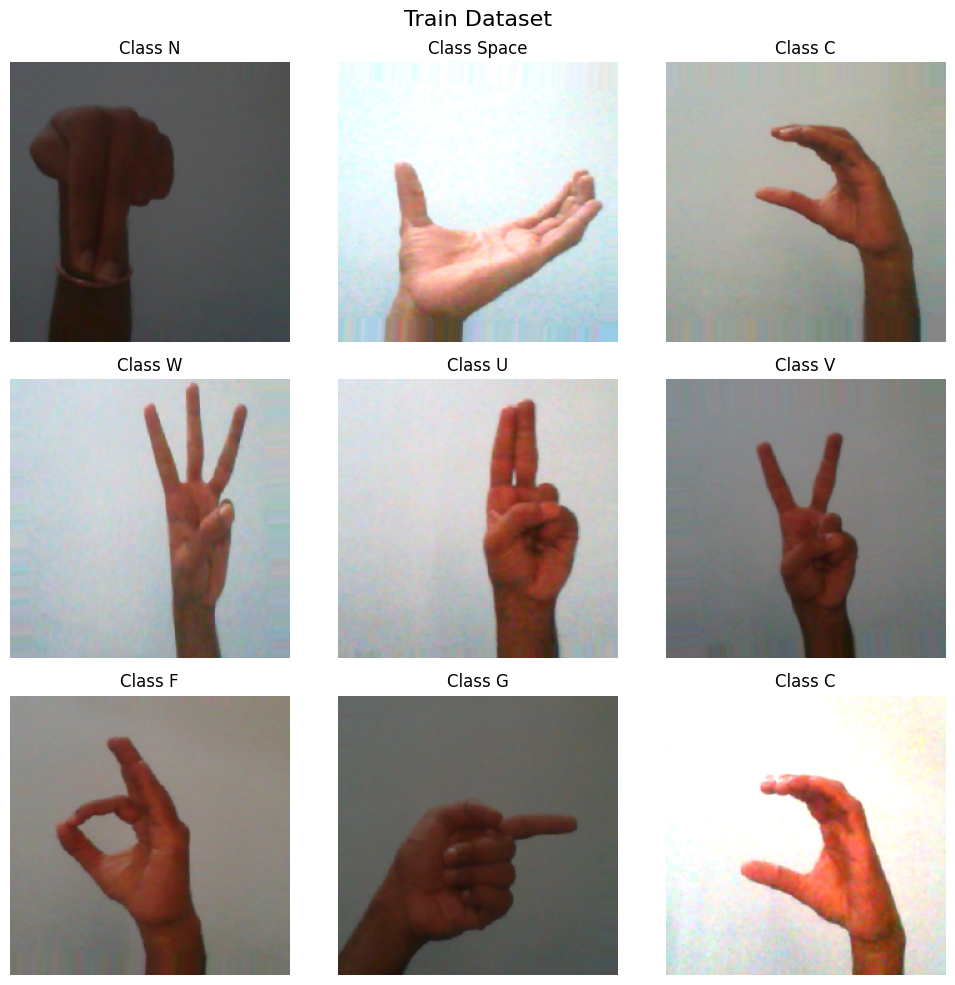

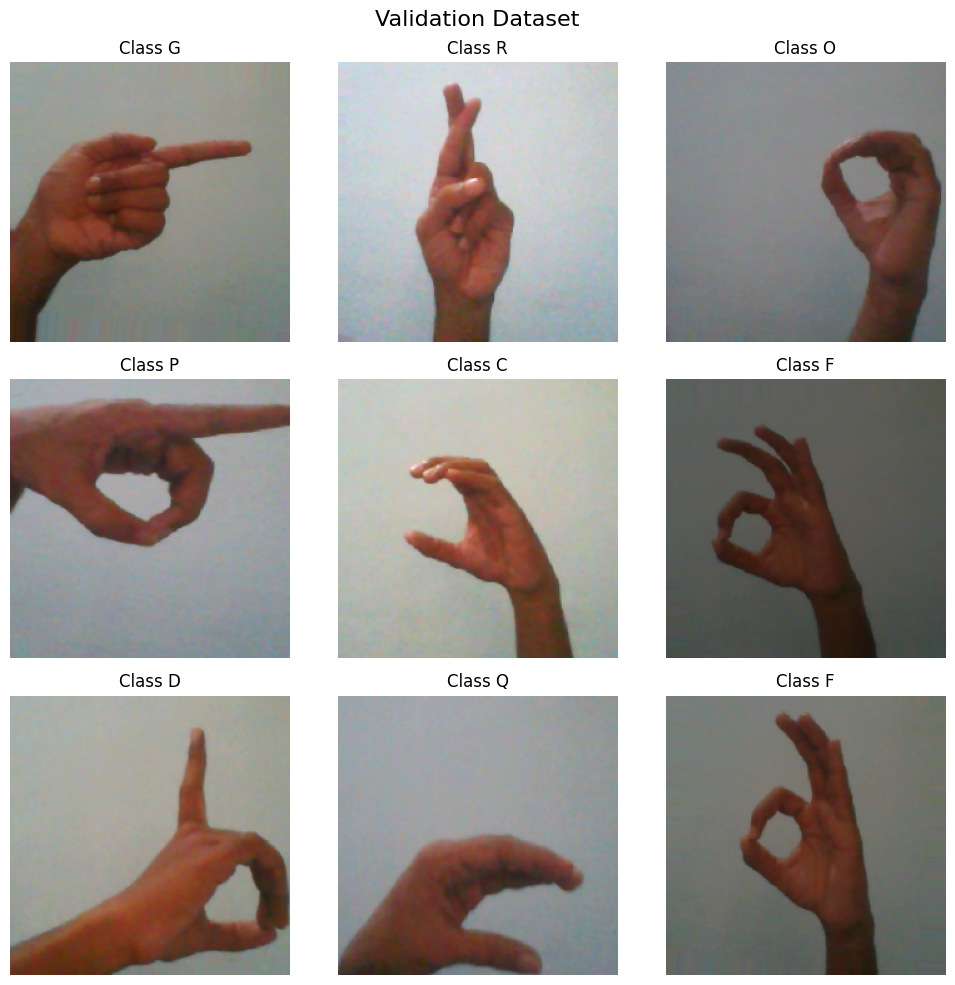

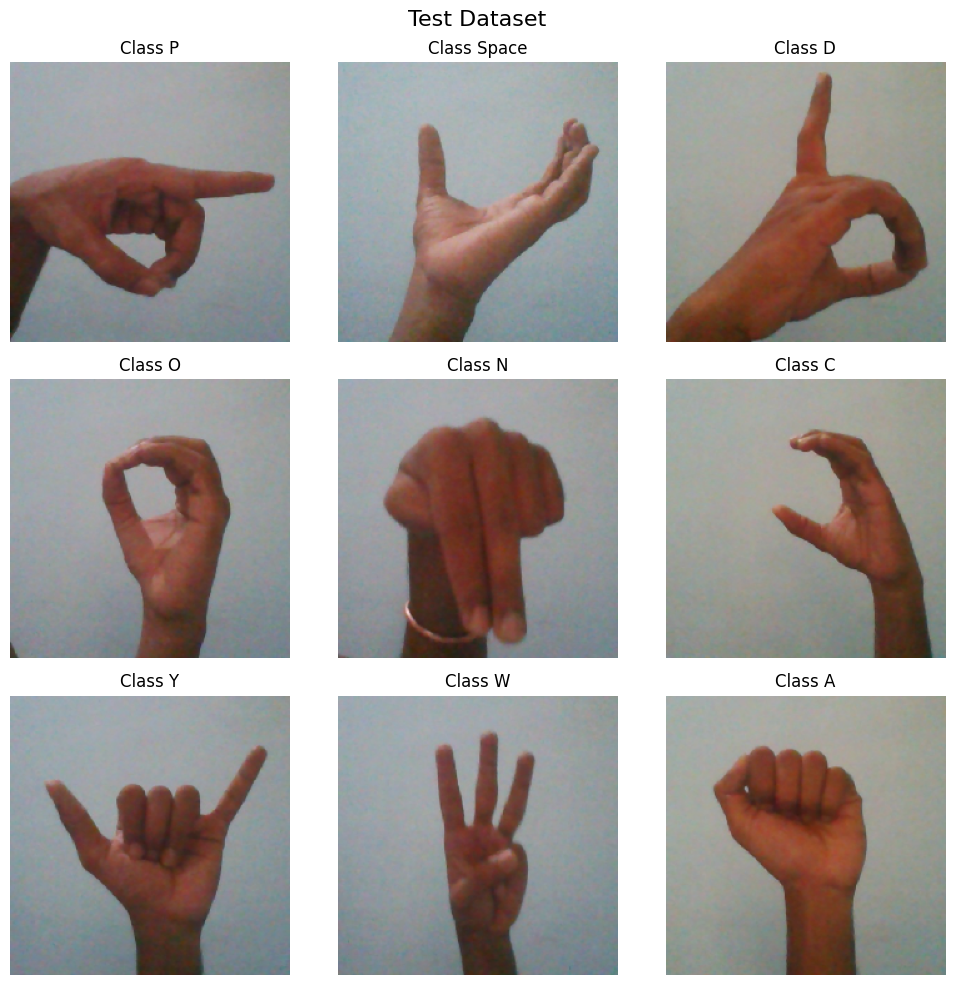

In [9]:

# Definir una función para mostrar imágenes desde un generador
def mostrar_imagenes_generador(generator, num_images=9, title="Dataset"):
    # Obtén un lote de imágenes y etiquetas
    images, labels = next(generator)
    class_labels = list(generator.class_indices.keys())
    
    # Configurar la cuadrícula de visualización
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    for i in range(num_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        # Convertir etiqueta en una cadena con el nombre de la clase
        label_idx = np.argmax(labels[i])
        label_name = class_labels[label_idx]
        plt.title("Class "+label_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Mostrar imágenes del conjunto de entrenamiento
mostrar_imagenes_generador(train_generator, num_images=9, title="Train Dataset")

# Mostrar imágenes del conjunto de validación
mostrar_imagenes_generador(validation_generator, num_images=9, title="Validation Dataset")

# Mostrar imágenes del conjunto de prueba
mostrar_imagenes_generador(test_generator, num_images=9, title="Test Dataset")

<hr>

## MODELS CNN 

### BASIC MODEL CCN 

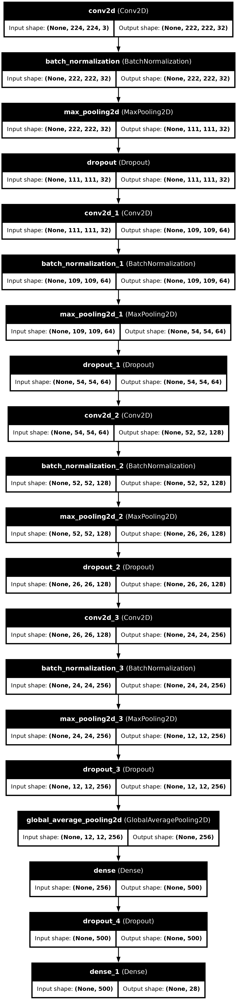

In [12]:
cnn=Sequential()
cnn.add(Input(shape=(224, 224, 3)))
# Primera capa convolucional
cnn.add(Conv2D(32, (3,3), activation='relu', kernel_regularizer=l2(0.001)))
cnn.add(BatchNormalization())
cnn.add(MaxPooling2D(2,2))
cnn.add(Dropout(0.2))

# Segunda capa convolucional
cnn.add(Conv2D(64, (3,3), activation='relu', kernel_regularizer=l2(0.001)))
cnn.add(BatchNormalization())
cnn.add(MaxPooling2D(2,2))
cnn.add(Dropout(0.3))

# Tercera capa convolucional
cnn.add(Conv2D(128, (3,3), activation='relu', kernel_regularizer=l2(0.001)))
cnn.add(BatchNormalization())
cnn.add(MaxPooling2D(2,2))
cnn.add(Dropout(0.3))

# Cuarta capa convolucional 
cnn.add(Conv2D(256, (3,3), activation='relu', kernel_regularizer=l2(0.001)))
cnn.add(BatchNormalization())
cnn.add(MaxPooling2D(2,2))
cnn.add(Dropout(0.3))

# Capa de Pooling global
cnn.add(GlobalAveragePooling2D())

# Capa densa con Dropout final
cnn.add(Dense(500, activation='relu'))
cnn.add(Dropout(0.5))
cnn.add(Dense(units=train_generator.num_classes, activation='softmax'))


plot_model(cnn, to_file="cnn_model.png", show_shapes=True, show_layer_names=True)

### OPTIMIZER CNN


In [13]:
cnn.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=[
        Recall,
        Precision,
        'accuracy'
    ]
)
# Use ReduceLROnPlateau to reduce learning rate when the validation loss plateaus
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, min_lr=1e-6)


cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 500)            │       128,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 28)             │        14,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 532,864 (2.03 MB)

 Trainable params: 531,904 (2.03 MB)

 Non-trainable params: 960 (3.75 KB)

### TRAINNING CNN


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731270373.477420     100 service.cc:145] XLA service 0x7dd398004be0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731270373.477469     100 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   1/4659 ━━━━━━━━━━━━━━━━━━━━ 27:03:47 21s/step - accuracy: 0.0000e+00 - loss: 4.5970 - precision: 0.0000e+00 - recall: 0.0000e+00

I0000 00:00:1731270385.199472     100 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4659/4659 ━━━━━━━━━━━━━━━━━━━━ 3581s 764ms/step - accuracy: 0.7170 - loss: 1.1015 - precision: 0.8930 - recall: 0.6416 - val_accuracy: 0.8228 - val_loss: 0.7561 - val_precision: 0.8604 - val_recall: 0.7960 - learning_rate: 0.0010
Epoch 2/10
   1/4659 ━━━━━━━━━━━━━━━━━━━━ 2:46 36ms/step - accuracy: 1.0000 - loss: 0.1617 - precision: 1.0000 - recall: 1.0000

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


4659/4659 ━━━━━━━━━━━━━━━━━━━━ 1s 198us/step - accuracy: 1.0000 - loss: 0.1617 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 0.7143 - val_loss: 0.8402 - val_precision: 0.8333 - val_recall: 0.7143 - learning_rate: 0.0010
Epoch 3/10
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 2630s 564ms/step - accuracy: 0.9794 - loss: 0.2234 - precision: 0.9814 - recall: 0.9778 - val_accuracy: 0.9698 - val_loss: 0.2187 - val_precision: 0.9735 - val_recall: 0.9668 - learning_rate: 0.0010
Epoch 4/10
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 0s 16us/step - accuracy: 1.0000 - loss: 0.1420 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 0.8571 - val_loss: 1.0042 - val_precision: 0.8571 - val_recall: 0.8571 - learning_rate: 0.0010
Epoch 5/10
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 2618s 561ms/step - accuracy: 0.9848 - loss: 0.1903 - precision: 0.9858 - recall: 0.9839 - val_accuracy: 0.8493 - val_loss: 0.6736 - val_precision: 0.8512 - val_recall: 0.8468 - learning_rate: 0.0010
Epoch 6/10
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 0s 18us/step

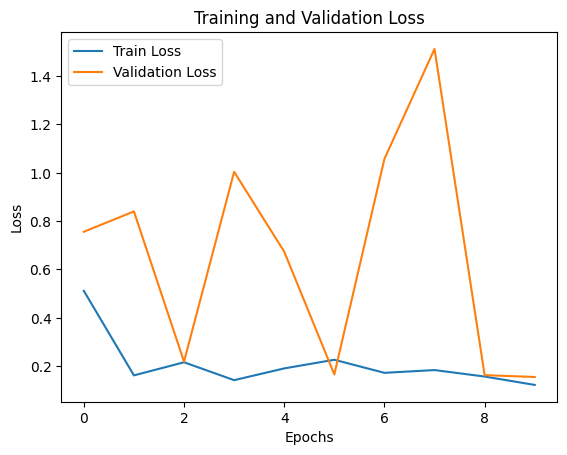

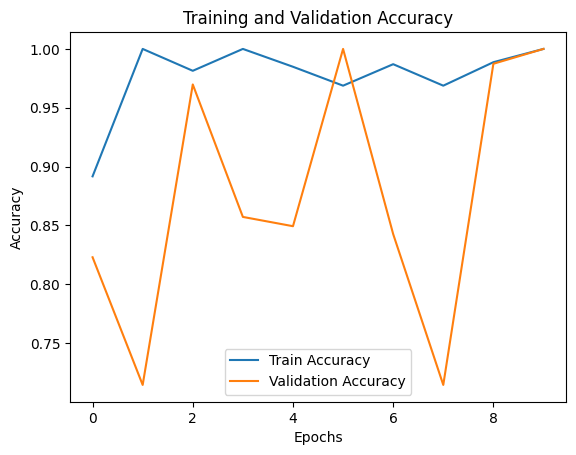

In [14]:

history=cnn.fit(train_generator,
                 epochs=10,
                 validation_data=validation_generator,
                 steps_per_epoch=train_generator.samples // train_generator.batch_size,
                 validation_steps=validation_generator.samples // validation_generator.batch_size,
                callbacks=[lr_reduction]
                )

results = cnn.evaluate(test_generator)
print("Test loss and accuracy:", results)

# Graficar la pérdida (loss) para entrenamiento y validación
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

# Graficar la precisión (accuracy) para entrenamiento y validación
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and Validation Accuracy")
plt.show()




### TEST

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 329ms/step


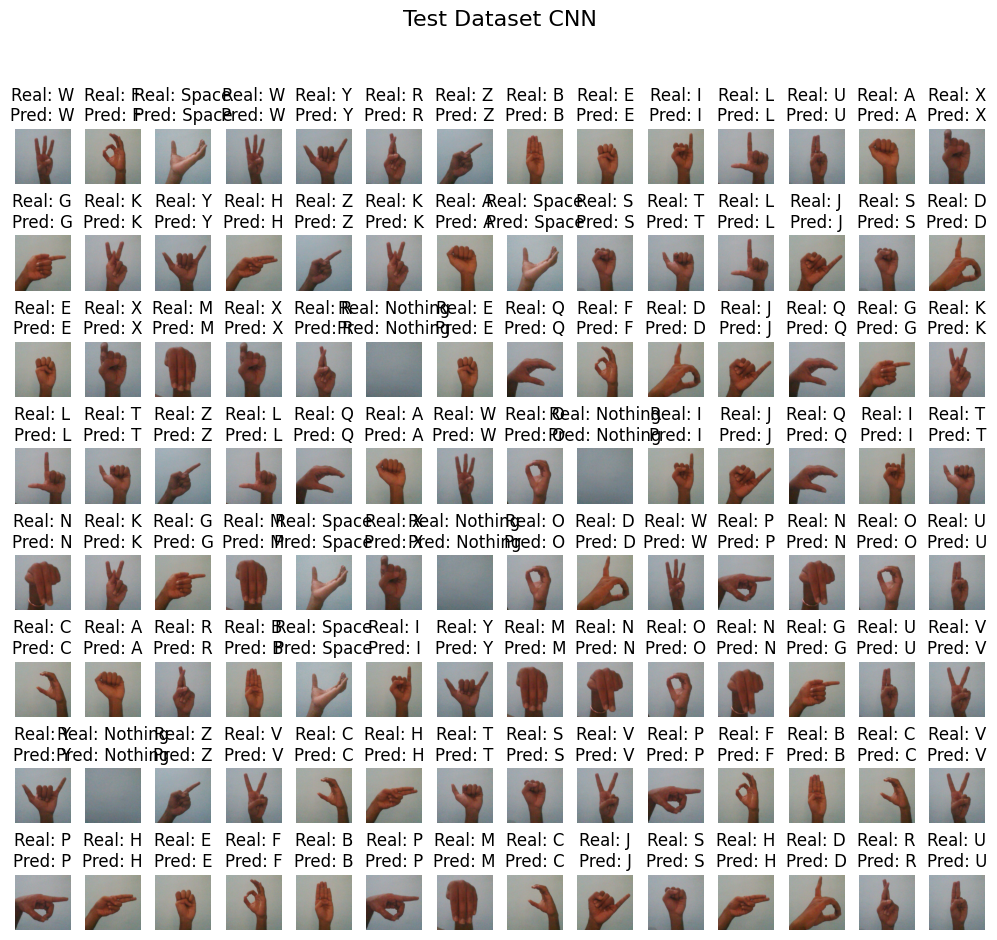

In [15]:
def mostrar_imagenes_generador_model(generator, model, num_images=9, title="Dataset"):
    # Obtén un lote de imágenes y etiquetas
    images, labels = next(generator)
    class_labels = list(generator.class_indices.keys())
    
    # Configurar la cuadrícula de visualización
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Realizar predicciones con el modelo
    predictions = model.predict(images)

    for i in range(num_images):
        plt.subplot(8, 14, i + 1)
        plt.imshow(images[i])
        
        # Obtener etiquetas reales y predichas
        true_label_idx = np.argmax(labels[i])
        pred_label_idx = np.argmax(predictions[i])
        
        # Convertir índices a nombres de clase
        true_label_name = class_labels[true_label_idx]
        pred_label_name = class_labels[pred_label_idx]
        
        # Título con etiquetas real y predicha
        plt.title(f"Real: {true_label_name}\nPred: {pred_label_name}")
        plt.axis('off')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Mostrar imágenes del conjunto de prueba
mostrar_imagenes_generador_model(test_generator, cnn, num_images=112, title="Test Dataset CNN")

In [16]:
cnn.save('model_cnn.h5', include_optimizer=False)

<hr>

### MODEL CNN - LEARNING TRANSFER (MobilNet)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


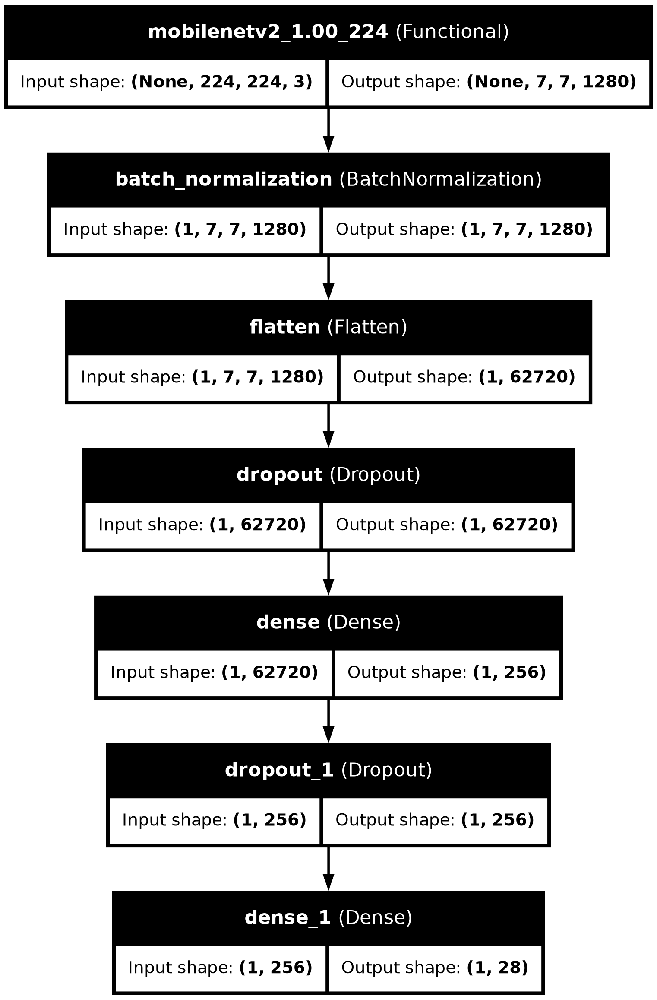

In [11]:
MobilNet=Sequential()
MobilNet.add(MobileNetV2(weights='imagenet',include_top=False,input_shape=(224,224,3)))
MobilNet.add(BatchNormalization())
MobilNet.add(Flatten())
MobilNet.add(Dropout(0.5))
MobilNet.add(Dense(256, activation='relu'))
MobilNet.add(Dropout(0.5))
MobilNet.add(Dense(units=train_generator.num_classes,activation='softmax',kernel_regularizer=l2(0.001)))

dummy_data = np.zeros((1, 224, 224, 3))
MobilNet(dummy_data)
plot_model(MobilNet, to_file="MobilNet.png", show_shapes=True, show_layer_names=True)


### OPTIMIZER MobilNet

In [12]:
MobilNet.compile(
    optimizer=Adam(),
    loss='categorical_crossentropy',
    metrics=[
        Recall,
        Precision,
        'accuracy'
    ]
)


MobilNet.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (1, 7, 7, 1280)        │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (1, 7, 7, 1280)        │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (1, 62720)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (1, 62720)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (1, 256)               │    16,056,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (1, 256)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (1, 28)                │         7,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,326,876 (69.91 MB)

 Trainable params: 18,290,204 (69.77 MB)

 Non-trainable params: 36,672 (143.25 KB)

### TRAINING MobilNet

Epoch 1/7


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731294509.762935     121 service.cc:145] XLA service 0x789984001df0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731294509.762995     121 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   1/4659 ━━━━━━━━━━━━━━━━━━━━ 72:17:03 56s/step - accuracy: 0.0938 - loss: 5.9650 - precision: 0.1111 - recall: 0.0625

I0000 00:00:1731294535.342280     121 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4659/4659 ━━━━━━━━━━━━━━━━━━━━ 3779s 799ms/step - accuracy: 0.8726 - loss: 0.7358 - precision: 0.9156 - recall: 0.8524 - val_accuracy: 0.2836 - val_loss: 354.9298 - val_precision: 0.2836 - val_recall: 0.2836
Epoch 2/7
   1/4659 ━━━━━━━━━━━━━━━━━━━━ 7:32 97ms/step - accuracy: 0.9688 - loss: 0.0687 - precision: 1.0000 - recall: 0.9688

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


4659/4659 ━━━━━━━━━━━━━━━━━━━━ 3s 563us/step - accuracy: 0.9688 - loss: 0.0687 - precision: 1.0000 - recall: 0.9688 - val_accuracy: 0.2857 - val_loss: 358.1489 - val_precision: 0.2857 - val_recall: 0.2857
Epoch 3/7
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 2749s 589ms/step - accuracy: 0.9673 - loss: 0.2333 - precision: 0.9770 - recall: 0.9624 - val_accuracy: 0.6131 - val_loss: 35.7435 - val_precision: 0.6134 - val_recall: 0.6131
Epoch 4/7
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 0s 11us/step - accuracy: 1.0000 - loss: 0.0132 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 0.5714 - val_loss: 35.1616 - val_precision: 0.5714 - val_recall: 0.5714
Epoch 5/7
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 2675s 573ms/step - accuracy: 0.9785 - loss: 0.1849 - precision: 0.9836 - recall: 0.9758 - val_accuracy: 0.9580 - val_loss: 0.8356 - val_precision: 0.9597 - val_recall: 0.9576
Epoch 6/7
4659/4659 ━━━━━━━━━━━━━━━━━━━━ 0s 13us/step - accuracy: 0.9375 - loss: 0.1886 - precision: 0.9677 - recall: 0.9375 - val_accuracy: 0.8571 -

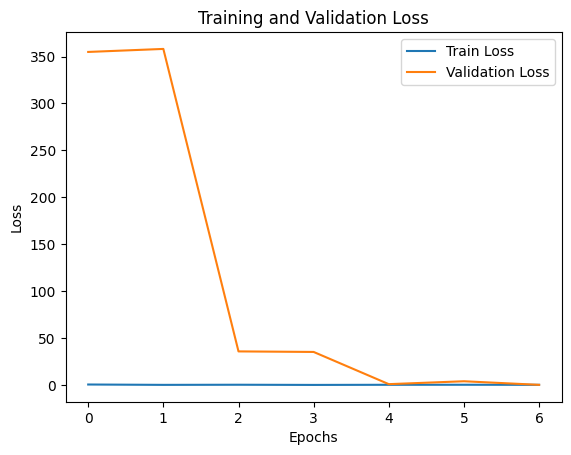

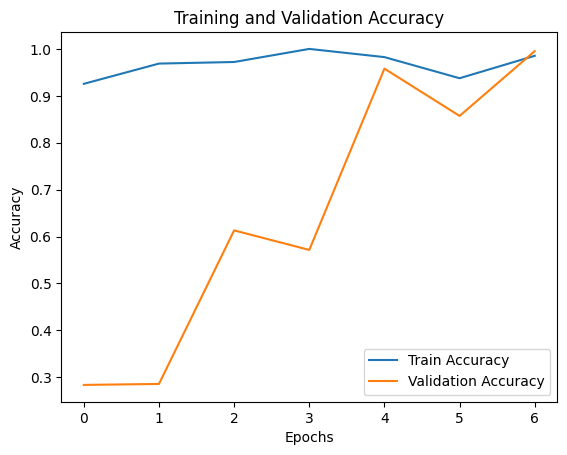

In [13]:

# Fit the model
history2 = MobilNet.fit(
    train_generator,
    epochs=7,
    validation_data=validation_generator,
    steps_per_epoch=train_generator.samples// train_generator.batch_size,
    validation_steps=validation_generator.samples// validation_generator.batch_size,
    batch_size=32

)

# Evaluate the model
results2 = MobilNet.evaluate(test_generator)
print("Test loss and accuracy:", results2)

# Graficar la pérdida (loss) para entrenamiento y validación
plt.plot(history2.history['loss'], label='Train Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

# Graficar la precisión (accuracy) para entrenamiento y validación
plt.plot(history2.history['accuracy'], label='Train Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and Validation Accuracy")
plt.show()




4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step


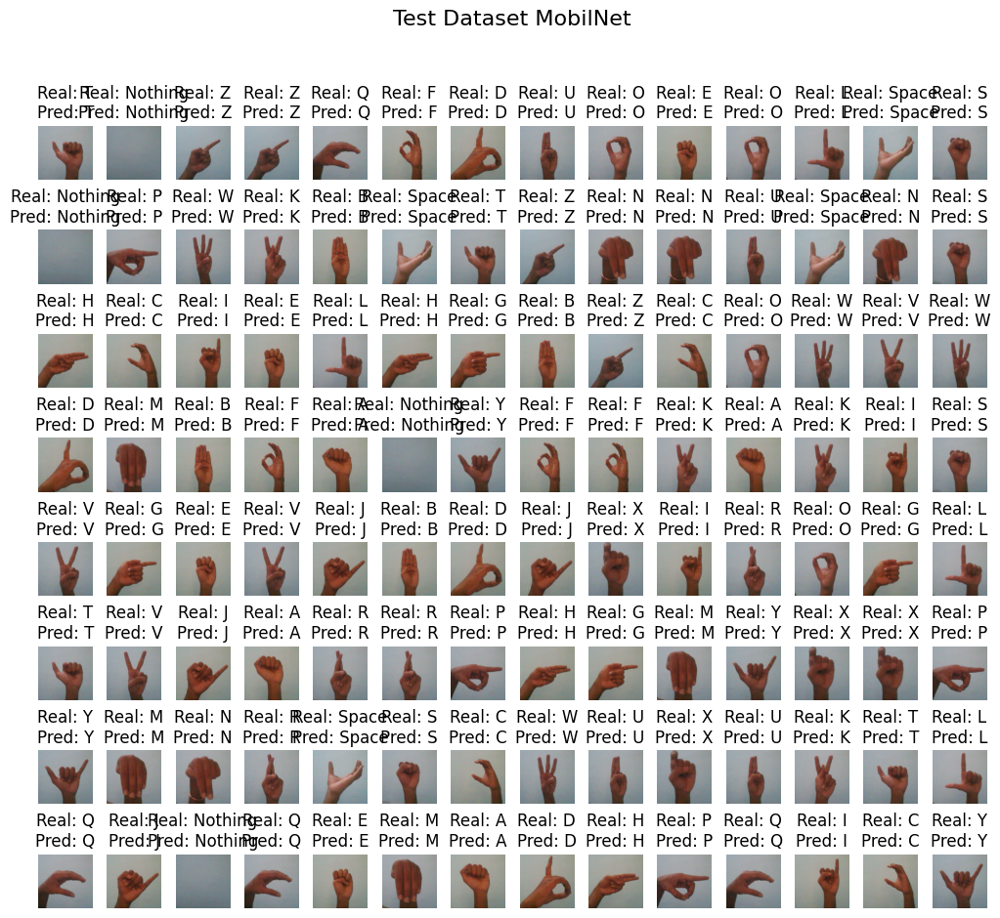

In [14]:


def mostrar_imagenes_generador_model(generator, model, num_images=9, title="Dataset"):
    # Obtén un lote de imágenes y etiquetas
    images, labels = next(generator)
    class_labels = list(generator.class_indices.keys())
    
    # Configurar la cuadrícula de visualización
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Realizar predicciones con el modelo
    predictions = model.predict(images)

    for i in range(num_images):
        plt.subplot(8, 14, i + 1)
        plt.imshow(images[i])
        
        # Obtener etiquetas reales y predichas
        true_label_idx = np.argmax(labels[i])
        pred_label_idx = np.argmax(predictions[i])
        
        # Convertir índices a nombres de clase
        true_label_name = class_labels[true_label_idx]
        pred_label_name = class_labels[pred_label_idx]
        
        # Título con etiquetas real y predicha
        plt.title(f"Real: {true_label_name}\nPred: {pred_label_name}")
        plt.axis('off')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Mostrar imágenes del conjunto de prueba
mostrar_imagenes_generador_model(test_generator, MobilNet, num_images=112, title="Test Dataset MobilNet")

In [15]:
MobilNet.save('MobilNet.h5', include_optimizer=False)

<hr>

In [ ]:
/kaggle/input/american-sign-language/ASL_Dataset/Train
/kaggle/input/asl-dataset/asl_dataset
/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train
/kaggle/input/handsignimages/Train

In [8]:
# Data augmentation configuration
train_= ImageDataGenerator(
    rescale=1./255

)
train_generator2=train_.flow_from_directory(
    train_path,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
    
)


Found 165670 images belonging to 28 classes.


In [9]:

RestNet=Sequential()
RestNet.add(ResNet101V2(weights='imagenet',include_top=False,input_shape=(224,224,3)))
RestNet.add(BatchNormalization())
RestNet.add(GlobalAveragePooling2D())
RestNet.add(Dense(1024, activation='relu'))
RestNet.add(Dense(units=train_generator.num_classes,activation='softmax',kernel_regularizer=l2(0.001)))



171317808/171317808 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [10]:
RestNet.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=[
        Recall,
        Precision,
        'accuracy'
    ]
)

# Use ReduceLROnPlateau to reduce learning rate when the validation loss plateaus
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, min_lr=1e-6)

RestNet.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet101v2 (Functional)        │ ?                      │    42,626,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,626,560 (162.61 MB)

 Trainable params: 42,528,896 (162.23 MB)

 Non-trainable params: 97,664 (381.50 KB)

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731373030.290584     104 service.cc:145] XLA service 0x7f56c4002610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731373030.290658     104 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1731373068.754824     104 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_46', 224 bytes spill stores, 224 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_45', 224 bytes spill stores, 224 byte

 589/4659 ━━━━━━━━━━━━━━━━━━━━ 16:32 244ms/step - accuracy: 0.9080 - loss: 0.3759 - precision: 0.9431 - recall: 0.8766

I0000 00:00:1731373244.836504     107 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_slice_fusion', 44 bytes spill stores, 44 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_47', 224 bytes spill stores, 224 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_41', 224 bytes spill stores, 224 bytes spill loads



4659/4659 ━━━━━━━━━━━━━━━━━━━━ 1286s 256ms/step - accuracy: 0.9754 - loss: 0.1138 - precision: 0.9833 - recall: 0.9689 - val_accuracy: 0.1071 - val_loss: 32.3508 - val_precision: 0.1071 - val_recall: 0.1071 - learning_rate: 0.0010
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step - accuracy: 0.1071 - loss: 32.3508 - precision: 0.1071 - recall: 0.1071
Test loss and accuracy: [32.35083770751953, 0.1071428582072258, 0.1071428582072258, 0.1071428582072258]


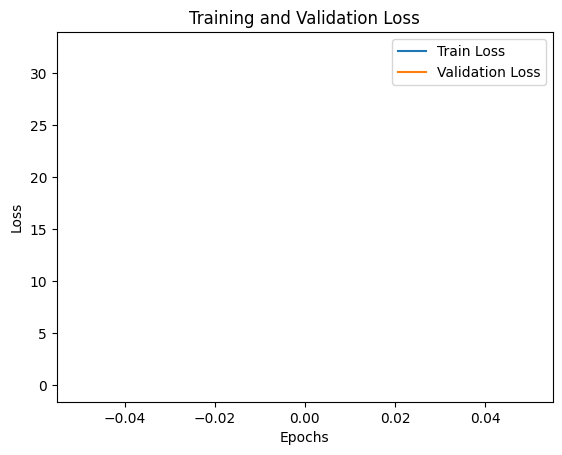

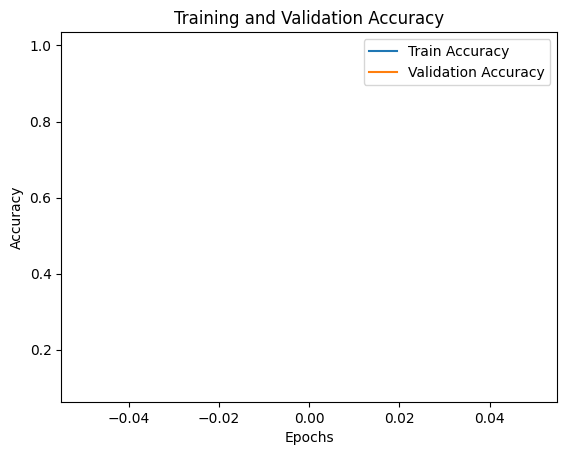

In [11]:
# Fit the model
history3 = RestNet.fit(
    train_generator2,
    epochs=1,
    validation_data=test_generator,
    steps_per_epoch=train_generator.samples// train_generator.batch_size,
    validation_steps=test_generator.samples// test_generator.batch_size,
    batch_size=32,
    callbacks=[lr_reduction]

)

# Evaluate the model
results3 = RestNet.evaluate(test_generator)
print("Test loss and accuracy:", results3)

# Graficar la pérdida (loss) para entrenamiento y validación
plt.plot(history3.history['loss'], label='Train Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

# Graficar la precisión (accuracy) para entrenamiento y validación
plt.plot(history3.history['accuracy'], label='Train Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and Validation Accuracy")
plt.show()


4/4 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step


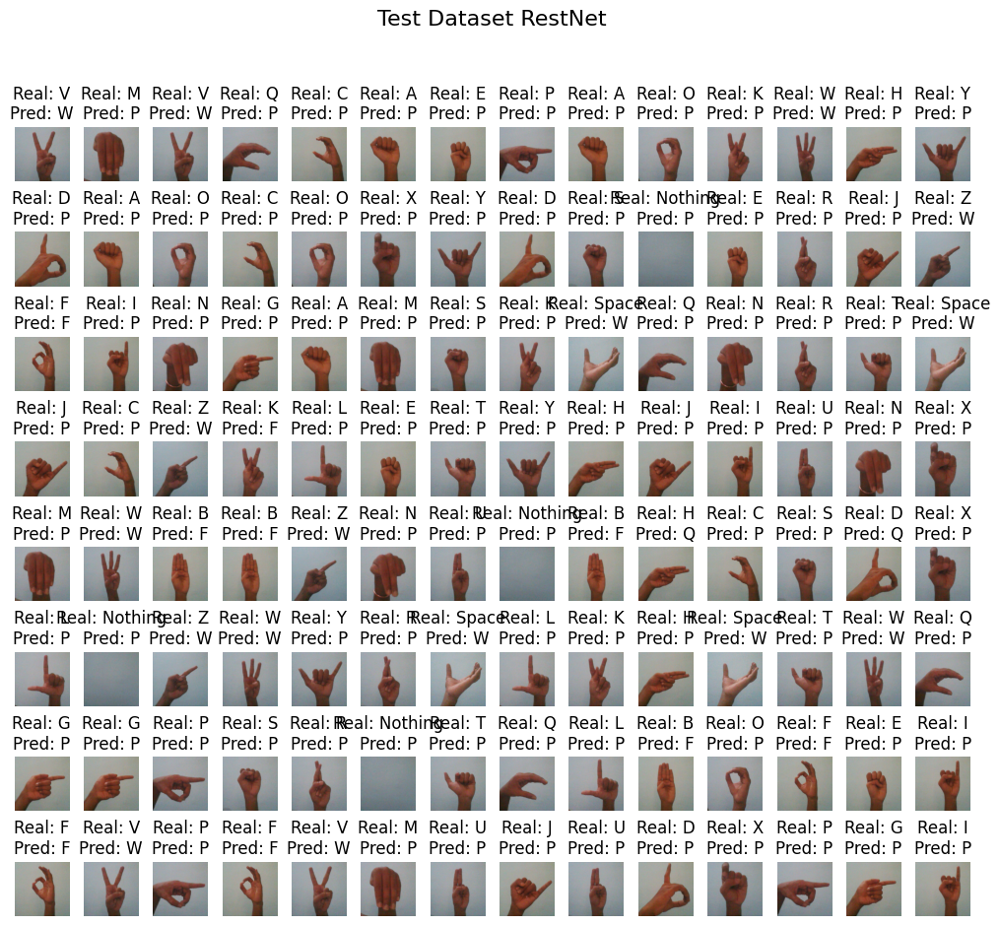

In [12]:
def mostrar_imagenes_generador_model(generator, model, num_images=9, title="Dataset"):
    # Obtén un lote de imágenes y etiquetas
    images, labels = next(generator)
    class_labels = list(generator.class_indices.keys())
    
    # Configurar la cuadrícula de visualización
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Realizar predicciones con el modelo
    predictions = model.predict(images)

    for i in range(num_images):
        plt.subplot(8, 14, i + 1)
        plt.imshow(images[i])
        
        # Obtener etiquetas reales y predichas
        true_label_idx = np.argmax(labels[i])
        pred_label_idx = np.argmax(predictions[i])
        
        # Convertir índices a nombres de clase
        true_label_name = class_labels[true_label_idx]
        pred_label_name = class_labels[pred_label_idx]
        
        # Título con etiquetas real y predicha
        plt.title(f"Real: {true_label_name}\nPred: {pred_label_name}")
        plt.axis('off')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Mostrar imágenes del conjunto de prueba
mostrar_imagenes_generador_model(test_generator, RestNet, num_images=112, title="Test Dataset RestNet")

In [23]:
RestNet.save('RestNet.h5', include_optimizer=False)

<hr>


## MAKE A DATASET TRAINNING

In [ ]:
import os
import shutil

# Directorios de entrada
input_dirs = [
    '/kaggle/input/american-sign-language/ASL_Dataset/Train',
    '/kaggle/input/asl-dataset/asl_dataset',
    '/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train',
    '/kaggle/input/handsignimages/Train'
]

# Directorio de salida
output_dir = '/kaggle/working/ASL_Combined'

# Crear el directorio de salida
os.makedirs(output_dir, exist_ok=True)

# Crear carpetas para cada letra del abecedario en el directorio de salida
letters = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
for letter in letters:
    os.makedirs(os.path.join(output_dir, letter), exist_ok=True)

# Copiar archivos por letra
for input_dir in input_dirs:
    for letter in letters:
        letter_dir = os.path.join(input_dir, letter)
        if os.path.exists(letter_dir):
            for filename in os.listdir(letter_dir):
                src_path = os.path.join(letter_dir, filename)
                dst_path = os.path.join(output_dir, letter, filename)
                
                # Evita duplicados
                if not os.path.exists(dst_path):
                    shutil.copy2(src_path, dst_path)

print("Archivos copiados correctamente en el directorio de salida por letra.")

# Comprime la carpeta ASL_Combined en un archivo zip
# shutil.make_archive('/kaggle/working/ASL_Combined', 'zip', '/kaggle/working/ASL_Combined')
# print('ZIP')


## DATASET

In [3]:
labels=os.listdir(train_path)

print(labels,len(labels))

['T', 'O', 'R', 'U', 'V', 'I', 'A', 'D', 'N', 'C', 'Y', 'F', 'W', 'B', 'Q', 'P', 'E', 'S', 'X', 'K', 'M', 'H', 'J', 'L', 'Z', 'G'] 26


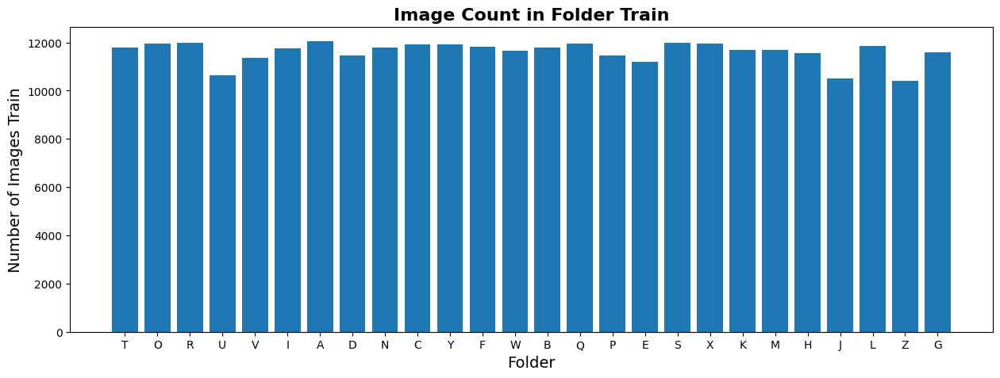

In [6]:
IMAGES=[]   

for i in labels:

    class_folder = os.path.join(train_path, i) 
    
    image_name = os.listdir(class_folder)
    nn=0
    for ii in range(len(image_name)):
        nn+=1
    #print(f'Folder: {i} {nn}')
    IMAGES.append(nn)

plt.figure(figsize=(15, 5)) 
plt.bar(labels, IMAGES)
plt.ylabel('Number of Images Train', fontsize=14)
plt.xlabel('Folder', fontsize=14)
plt.title('Image Count in Folder Train', fontsize=16, fontweight='bold')
plt.show()

In [ ]:
train= ImageDataGenerator(
    rescale=1./255
)
train_generator = train.flow_from_directory(
    train_path,
    target_size=(64, 224),
    batch_size=32,
    class_mode='categorical',
    color_mode='grayscale',  # Convertir las imágenes a escala de grises
    subset='training',  # Usa el 90% de las imágenes para entrenamiento
    shuffle=True  # Mezcla aleatoriamente las imágenes en cada lote
)